In [83]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt

from sklearn.model_selection import train_test_split

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from xgboost import XGBClassifier

from sklearn.metrics import accuracy_score

In [2]:
#pip install lime

In [2]:
file = "D:/Study material/sem8/data/heart.csv"
data = pd.read_csv(file)
data.head()

,age,sex,cp,trtbps,chol,fbs,restecg,thalachh,exng,oldpeak,slp,caa,thall,output
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1


exang: exercise induced angina (1 = yes; 0 = no)

ca: number of major vessels (0-3)

cp : Chest Pain type chest pain type

Value 1: typical angina
Value 2: atypical angina
Value 3: non-anginal pain
Value 4: asymptomatic
trtbps : resting blood pressure (in mm Hg)

chol : cholestoral in mg/dl fetched via BMI sensor

fbs : (fasting blood sugar > 120 mg/dl) (1 = true; 0 = false)

rest_ecg : resting electrocardiographic results

Value 0: normal
Value 1: having ST-T wave abnormality (T wave inversions and/or ST elevation or depression of > 0.05 mV)
Value 2: showing probable or definite left ventricular hypertrophy by Estes' criteria
thalach : maximum heart rate achieved

target : 0= lesser risk for heart attack 1= higher risk for heart attack



In [3]:
data.isnull().sum()

age         0
sex         0
cp          0
trtbps      0
chol        0
fbs         0
restecg     0
thalachh    0
exng        0
oldpeak     0
slp         0
caa         0
thall       0
output      0
dtype: int64

In [4]:
data.drop_duplicates(keep='first',inplace=True)
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 302 entries, 0 to 302
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       302 non-null    int64  
 1   sex       302 non-null    int64  
 2   cp        302 non-null    int64  
 3   trtbps    302 non-null    int64  
 4   chol      302 non-null    int64  
 5   fbs       302 non-null    int64  
 6   restecg   302 non-null    int64  
 7   thalachh  302 non-null    int64  
 8   exng      302 non-null    int64  
 9   oldpeak   302 non-null    float64
 10  slp       302 non-null    int64  
 11  caa       302 non-null    int64  
 12  thall     302 non-null    int64  
 13  output    302 non-null    int64  
dtypes: float64(1), int64(13)
memory usage: 35.4 KB


In [5]:
y = data["output"]
x = data.drop(["output"],axis=1)

In [6]:
y.head()

0    1
1    1
2    1
3    1
4    1
Name: output, dtype: int64

In [7]:
x.head()

,age,sex,cp,trtbps,chol,fbs,restecg,thalachh,exng,oldpeak,slp,caa,thall
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2


In [8]:
mx = np.max(x)
mn = np.min(x)
x = (x - np.min(x))/(np.max(x)-np.min(x))

C:\Users\Siva\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
C:\Users\Siva\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:84: FutureWarning: In a future version, DataFrame.min(axis=None) will return a scalar min over the entire DataFrame. To retain the old behavior, use 'frame.min(axis=0)' or just 'frame.min()'
  return reduction(axis=axis, out=out, **passkwargs)


In [9]:
print(mx)

age          77.0
sex           1.0
cp            3.0
trtbps      200.0
chol        564.0
fbs           1.0
restecg       2.0
thalachh    202.0
exng          1.0
oldpeak       6.2
slp           2.0
caa           4.0
thall         3.0
dtype: float64


In [10]:
print(mn)

age          29.0
sex           0.0
cp            0.0
trtbps       94.0
chol        126.0
fbs           0.0
restecg       0.0
thalachh     71.0
exng          0.0
oldpeak       0.0
slp           0.0
caa           0.0
thall         0.0
dtype: float64


In [11]:
x.head()

,age,sex,cp,trtbps,chol,fbs,restecg,thalachh,exng,oldpeak,slp,caa,thall
0,0.708333,1.0,1.000000,0.481132,0.244292,1.0,0.0,0.603053,0.0,0.370968,0.0,0.0,0.333333
1,0.166667,1.0,0.666667,0.339623,0.283105,0.0,0.5,0.885496,0.0,0.564516,0.0,0.0,0.666667
2,0.250000,0.0,0.333333,0.339623,0.178082,0.0,0.0,0.770992,0.0,0.225806,1.0,0.0,0.666667
3,0.562500,1.0,0.333333,0.245283,0.251142,0.0,0.5,0.816794,0.0,0.129032,1.0,0.0,0.666667
4,0.583333,0.0,0.000000,0.245283,0.520548,0.0,0.5,0.702290,1.0,0.096774,1.0,0.0,0.666667


In [12]:
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.2)

In [13]:
print(x_train['age'].size,y_train.size)
print(x_test['age'].size,y_test.size)

241 241
61 61


In [14]:
#####Logistic Regression

In [15]:
mod1 = LogisticRegression()
mod1.fit(x_train, y_train)
# Prediction
y_pred = mod1.predict(x_test)
 
acc_lr = accuracy_score(y_test, y_pred)
print("Logistic Regression model", acc_lr)

Logistic Regression model 0.819672131147541


In [16]:
######Decision Tree

In [17]:
tree1 = DecisionTreeClassifier(criterion="entropy",random_state=100, max_depth=6, min_samples_leaf=8)
tree1.fit(x_train,y_train)
#Prediction
y_pred = tree1.predict(x_test)
acc_tree = accuracy_score(y_test,y_pred)
print("Decision Tree model", acc_tree)

Decision Tree model 0.8032786885245902


In [18]:
##########KNN

In [19]:
knn = KNeighborsClassifier(n_neighbors=5, leaf_size=50)
knn.fit(x_train,y_train)
#Predictin
y_pred = knn.predict(x_test)
acc_knn = accuracy_score(y_test,y_pred)
print("KNN model",acc_knn)

KNN model 0.819672131147541


In [20]:
###########Random Forest

In [21]:
param_grid = { 
    'n_estimators': [500,700],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [5,15],
    'criterion' :['gini', 'entropy']
}
rfc=RandomForestClassifier(random_state=42)

In [22]:
CV_rfc = GridSearchCV(estimator=rfc, param_grid=param_grid, cv= 5)
CV_rfc.fit(x_train, y_train)

C:\Users\Siva\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
C:\Users\Siva\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
C:\Users\Siva\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for Ran

C:\Users\Siva\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
C:\Users\Siva\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
C:\Users\Siva\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for Ran

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42),
             param_grid={'criterion': ['gini', 'entropy'], 'max_depth': [5, 15],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': [500, 700]})

In [23]:
CV_rfc.best_params_

{'criterion': 'entropy',
 'max_depth': 5,
 'max_features': 'auto',
 'n_estimators': 700}

In [27]:
rcf1 = RandomForestClassifier(random_state=42,criterion='gini',max_depth=5, max_features='auto', n_estimators=700)
rcf1.fit(x_train,y_train)
y_pred = rcf1.predict(x_test)
acc_rf = accuracy_score(y_test,y_pred)
print("Random Forest",acc_rf)

C:\Users\Siva\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


Random Forest 0.8524590163934426


In [87]:
xgb = XGBClassifier(n_estimators = 600, learning_rate = 0.05, use_label_encoder = False, eval_metric = "logloss", n_jobs = -1)
xgb.fit(x_train,y_train)
y_pred = rcf1.predict(x_test)
acc_xgb = accuracy_score(y_test,y_pred)
print("XGBoost Accuracy",acc_xgb)

C:\Users\Siva\anaconda3\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")


XGBoost Accuracy 0.8524590163934426


# EXPLAINABLE MODEL

Using lime library

In [28]:
from lime import lime_tabular

In [29]:
explainer = lime_tabular.LimeTabularExplainer(training_data = np.array(x_train), 
                                               mode = "regression", feature_names = x_train.columns, 
                                              categorical_features = [1,2,5,6,8,10,11,12])


In [53]:
explain = explainer.explain_instance(data_row = x_test.iloc[2], predict_fn = tree1.predict)
explain.show_in_notebook(show_table = True)

C:\Users\Siva\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


In [54]:
lst = explain.as_list()
lst.sort()
print(lst)

[('0.00 < oldpeak <= 0.13', 0.07058226082475705), ('0.40 < age <= 0.56', 0.07798139104949732), ('caa=0', 0.2858619652303897), ('chol > 0.34', -0.05981098423461211), ('cp=0', 0.24128236810805453), ('fbs=0', -0.027476064630261973), ('restecg=0', 0.02190545107370836), ('sex=1', -0.08961173176113228), ('slp=1', 0.08409682259739516), ('thall=0', 0.2479057545843138)]


In [71]:
def explain_function(pred,lst):
    if(pred):
        print('You are in risk of a heart attack')
    else:
        print('You are not in risk of a heart attack')
    print('################## REASON ################')
    for ind in lst:
        print(ind[0],' which factored has a weightage of',ind[1])
        var_name = ''
        num = ''
        temp_lst = []
        for j in ind[0]:
            if(j>='a' and j<='z'):
                var_name = var_name + j
            if((j>='0' and j<='9') or j=='.'):
                num = num + j
            elif(num):
                temp_lst.append(float(num))
                num = ''
        if(num):
            temp_lst.append(float(num))
        
        if(len(temp_lst)==1):
            non_normal_val = mx[var_name]*temp_lst[0] + mn[var_name]
            if('<' in ind[0]):
                print('Entered',var_name,'is less than',non_normal_val)
            elif('>' in ind[0]):
                print('Entered',var_name,'is greater than',non_normal_val)
            else:
                print('Entered',var_name,'is equal to',non_normal_val)
        else:
            print('Entered', var_name,'int between',mx[var_name]*temp_lst[0] + mn[var_name],'and',mx[var_name]*temp_lst[1] + mn[var_name])
    

In [72]:
explain_function(1,lst)

You are in risk of a heart attack
################## REASON ################
0.00 < oldpeak <= 0.13  which factored has a weightage of 0.07058226082475705
Entered oldpeak int between 0.0 and 0.806
0.40 < age <= 0.56  which factored has a weightage of 0.07798139104949732
Entered age int between 59.8 and 72.12
caa=0  which factored has a weightage of 0.2858619652303897
Entered caa is equal to 0.0
chol > 0.34  which factored has a weightage of -0.05981098423461211
Entered chol is greater than 317.76
cp=0  which factored has a weightage of 0.24128236810805453
Entered cp is equal to 0.0
fbs=0  which factored has a weightage of -0.027476064630261973
Entered fbs is equal to 0.0
restecg=0  which factored has a weightage of 0.02190545107370836
Entered restecg is equal to 0.0
sex=1  which factored has a weightage of -0.08961173176113228
Entered sex is equal to 1.0
slp=1  which factored has a weightage of 0.08409682259739516
Entered slp is equal to 2.0
thall=0  which factored has a weightage of 0

In [55]:
y_pred = tree1.predict(x_test)

In [56]:
y_pred

array([1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0,
       1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0,
       0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1], dtype=int64)

In [57]:
y_test.head()

142    1
219    0
45     1
66     1
23     1
Name: output, dtype: int64

In [28]:
data.head()

,age,sex,cp,trtbps,chol,fbs,restecg,thalachh,exng,oldpeak,slp,caa,thall,output
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1


# Inputting Values from the user

In [73]:
age = int(input('Enter age '))
gend = 1 if(input('Enter gender M or F ')=='M')else 0
cp = int(input('Enter chest pain level from 1 to 5 (1 being no pain and 5 being severe pain)'))
trbps = int(input('Enter blood pressure '))
chol = int(input('Enter cholestrol level '))
fbs = int(input('Enter blood sugar value '))
restecg = int(input('Enter ECG value if available else enter 0'))
thalachh = int(input('Enter heart rate '))
exng = 1 if(input('Enter YES if you have expirienced exercise induced angia else NO ') =='YES') else 0
oldpeak = int(input('Enter old peak value of heart rate without any exercise if available else enter -1 ')) 
slp =  int(input('Enter level of speech language defects on the scale of 0 to 2 '))
caa = int(input('Enter level of Coronary Artery Anomalies on the scale of 0 to 4 '))
thall = np.mean(data['thall'])                                     
                  
if(oldpeak == -1): oldpeak = np.mean(data['oldpeak'])
#if(slp == -1): slp = np.mean(data['slp'])
#if(caa == -1): caa = np.mean(data['caa'])

Enter age 20
Enter gender M or F M
Enter chest pain level from 1 to 5 (1 being no pain and 5 being severe pain)1
Enter blood pressure 120
Enter cholestrol level 195
Enter blood sugar value 110
Enter ECG value if available else enter 00
Enter heart rate 70
Enter YES if you have expirienced exercise induced angia else NO NO
Enter old peak value of heart rate without any exercise if available else enter -1 -1
Enter level of speech language defects on the scale of 0 to 2 0
Enter level of Coronary Artery Anomalies on the scale of 0 to 4 0


In [74]:
#Normalising the input
age = (age-mn['age'])/(mx['age']-mn['age'])
cp = (cp-mn['cp'])/(mx['cp']-mn['cp'])
trtbps = (trbps-mn['trtbps'])/(mx['trtbps']-mn['trtbps'])
chol = (chol-mn['chol'])/(mx['age']-mn['chol'])
fbs = (fbs-mn['fbs'])/(mx['fbs']-mn['fbs'])
restecg = (restecg-mn['restecg'])/(mx['restecg']-mn['restecg'])
thalachh = (thalachh-mn['thalachh'])/(mx['thalachh']-mn['thalachh'])
oldpeak = (oldpeak-mn['oldpeak'])/(mx['oldpeak']-mn['oldpeak'])
slp = (slp-mn['slp'])/(mx['slp']-mn['slp'])
caa = (caa-mn['caa'])/(mx['caa']-mn['caa'])
thall = (thall-mn['thall'])/(mx['thall']-mn['thall'])

In [31]:
x.head()

,age,sex,cp,trtbps,chol,fbs,restecg,thalachh,exng,oldpeak,slp,caa,thall
0,0.708333,1.0,1.000000,0.481132,0.244292,1.0,0.0,0.603053,0.0,0.370968,0.0,0.0,0.333333
1,0.166667,1.0,0.666667,0.339623,0.283105,0.0,0.5,0.885496,0.0,0.564516,0.0,0.0,0.666667
2,0.250000,0.0,0.333333,0.339623,0.178082,0.0,0.0,0.770992,0.0,0.225806,1.0,0.0,0.666667
3,0.562500,1.0,0.333333,0.245283,0.251142,0.0,0.5,0.816794,0.0,0.129032,1.0,0.0,0.666667
4,0.583333,0.0,0.000000,0.245283,0.520548,0.0,0.5,0.702290,1.0,0.096774,1.0,0.0,0.666667


In [82]:
inp_lst = [age,gend,cp,trtbps,chol,fbs,restecg,thalachh,exng,oldpeak,slp,caa,thall]

explain = explainer.explain_instance(data_row = np.array(lst), predict_fn = tree1.predict)
explain.show_in_notebook(show_table = True)

C:\Users\Siva\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


In [79]:
inp = []
inp.append(inp_lst)

out = tree1.predict(inp)
print(out)

[1]


C:\Users\Siva\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


In [80]:
explain_function(out[0],explain.as_list())

You are in risk of a heart attack
################## REASON ################
cp=0  which factored has a weightage of 0.27802013261602554
Entered cp is equal to 0.0
caa=0  which factored has a weightage of 0.27621674055912954
Entered caa is equal to 0.0
sex=1  which factored has a weightage of -0.09344391918873324
Entered sex is equal to 1.0
0.13 < oldpeak <= 0.29  which factored has a weightage of -0.08771745501936483
Entered oldpeak int between 0.806 and 1.7979999999999998
age <= 0.40  which factored has a weightage of 0.08546119045362455
Entered age is less than 59.8
chol <= 0.19  which factored has a weightage of 0.07344657547095376
Entered chol is less than 233.16
slp=0  which factored has a weightage of -0.031589858922795123
Entered slp is equal to 0.0
fbs=110  which factored has a weightage of 0.027702143609506884
Entered fbs is equal to 110.0
thall=0  which factored has a weightage of 0.02770214360950688
Entered thall is equal to 0.0
exng=0  which factored has a weightage of 0.0

# Results of different models with XAI

### Using LIME

#### Logistic Regression

In [88]:
explain = explainer.explain_instance(data_row = x_test.iloc[0], predict_fn = mod1.predict)
explain.show_in_notebook(show_table = True)

C:\Users\Siva\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


#### KNN

In [91]:
explain = explainer.explain_instance(data_row = x_test.iloc[0], predict_fn = knn.predict)
explain.show_in_notebook(show_table = True)

C:\Users\Siva\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


#### Random Forest Classifier

In [93]:
explain = explainer.explain_instance(data_row = x_test.iloc[0], predict_fn = rcf1.predict)
explain.show_in_notebook(show_table = True)

C:\Users\Siva\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


#### Decision Tree

In [94]:
explain = explainer.explain_instance(data_row = x_test.iloc[0], predict_fn = tree1.predict)
explain.show_in_notebook(show_table = True)

C:\Users\Siva\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


#### XGBoost Classifier

In [95]:
explain = explainer.explain_instance(data_row = x_test.iloc[0], predict_fn = xgb.predict)
explain.show_in_notebook(show_table = True)

### Using SHAP

In [97]:
#pip install shap

In [98]:
import shap

#### Logistic Regression

In [113]:
shap_explainer = shap.Explainer(mod1.predict, x_test)
shap_values = shap_explainer(x_test)

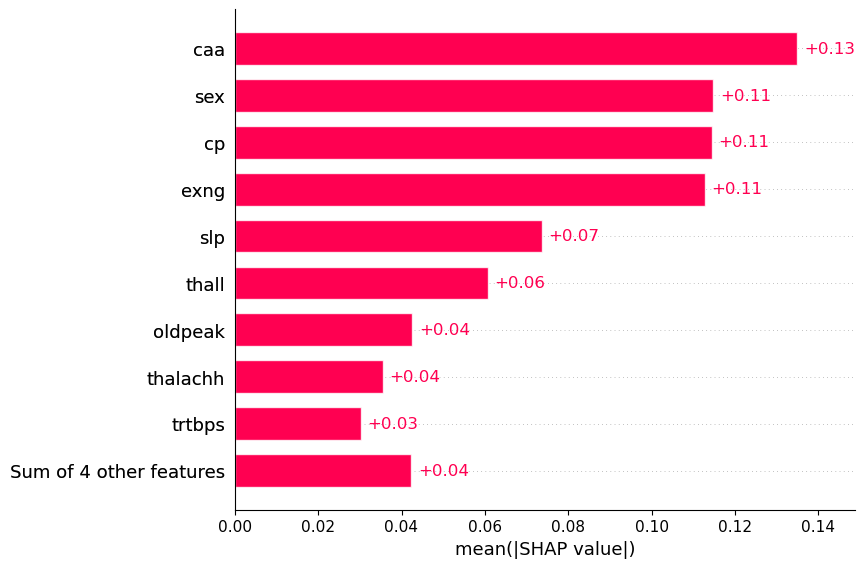

In [114]:
shap.plots.bar(shap_values)

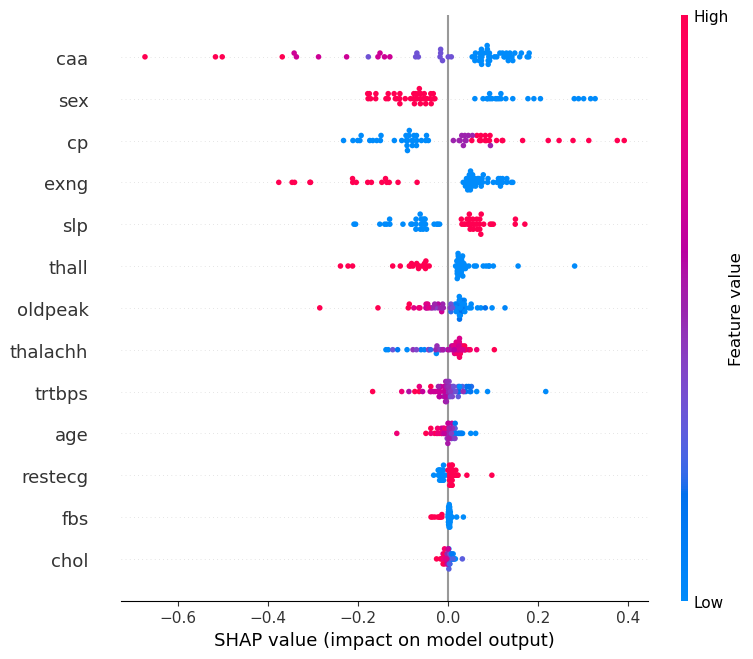

In [107]:
shap.summary_plot(shap_values)

#### KNN

PermutationExplainer explainer: 62it [00:41,  1.08it/s]                                                                


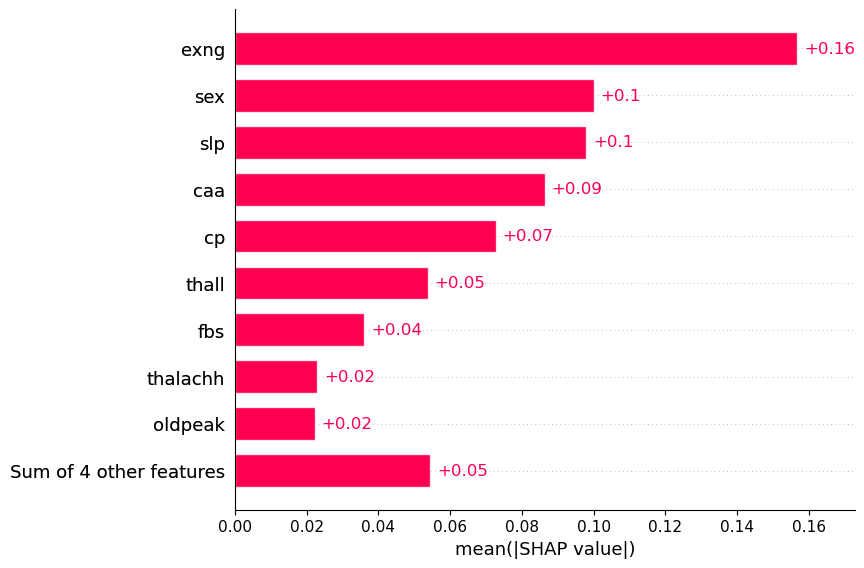

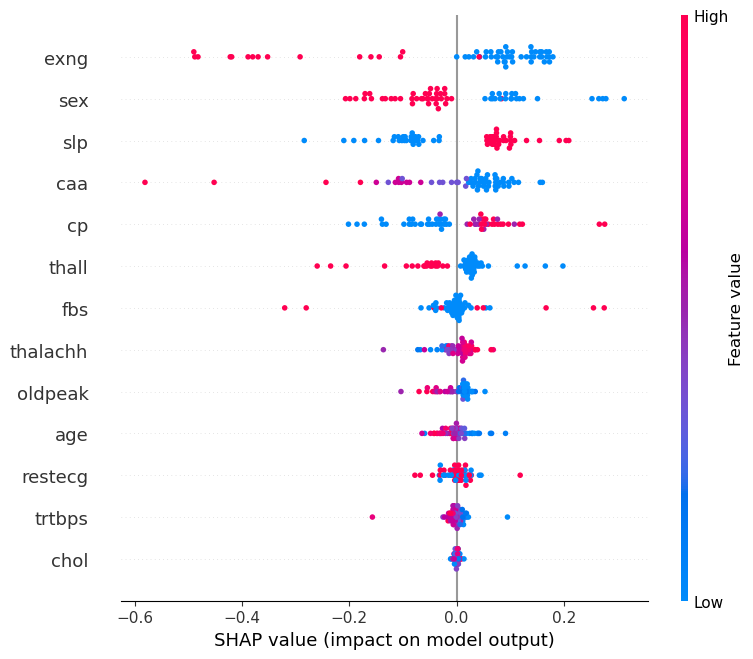

In [117]:
shap_explainer = shap.Explainer(knn.predict, x_test)
shap_values = shap_explainer(x_test)
shap.plots.bar(shap_values)
shap.summary_plot(shap_values)

#### Random Forest Classifier

PermutationExplainer explainer: 62it [02:01,  2.13s/it]                                                                


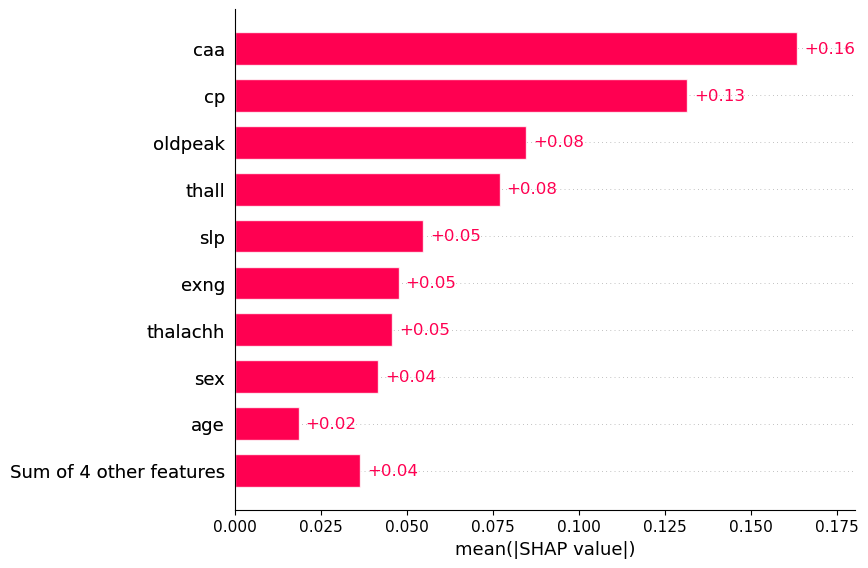

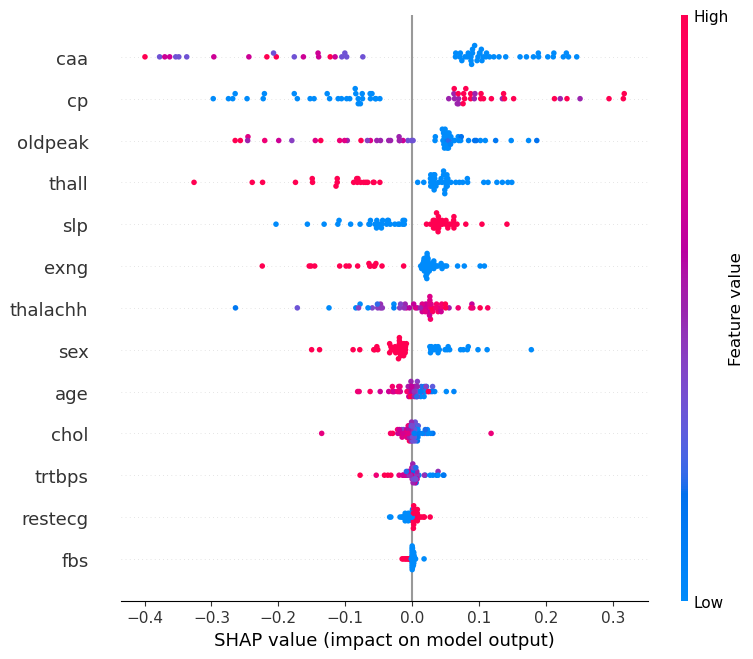

In [116]:
shap_explainer = shap.Explainer(rcf1.predict, x_test)
shap_values = shap_explainer(x_test)
shap.plots.bar(shap_values)
shap.summary_plot(shap_values)

#### Decision Tree

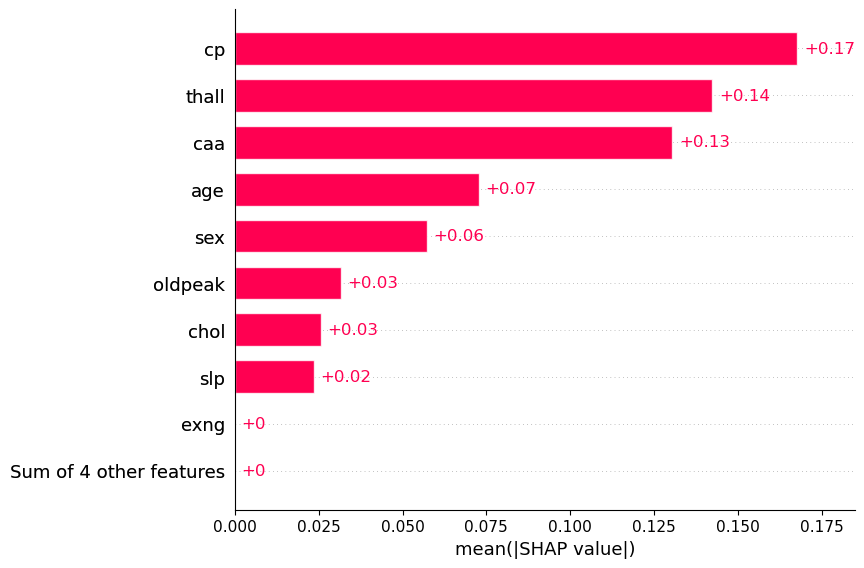

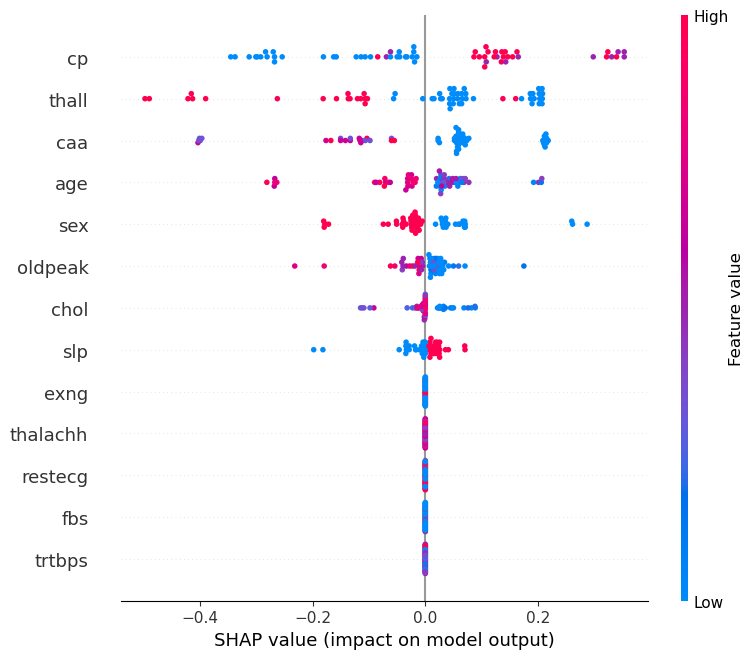

In [118]:
shap_explainer = shap.Explainer(tree1.predict, x_test)
shap_values = shap_explainer(x_test)
shap.plots.bar(shap_values)
shap.summary_plot(shap_values)

#### XGBoost Classifier

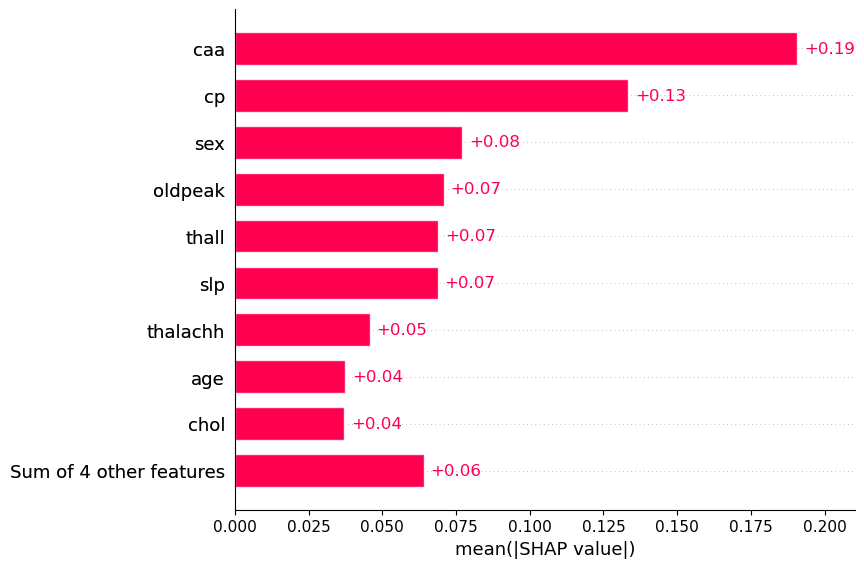

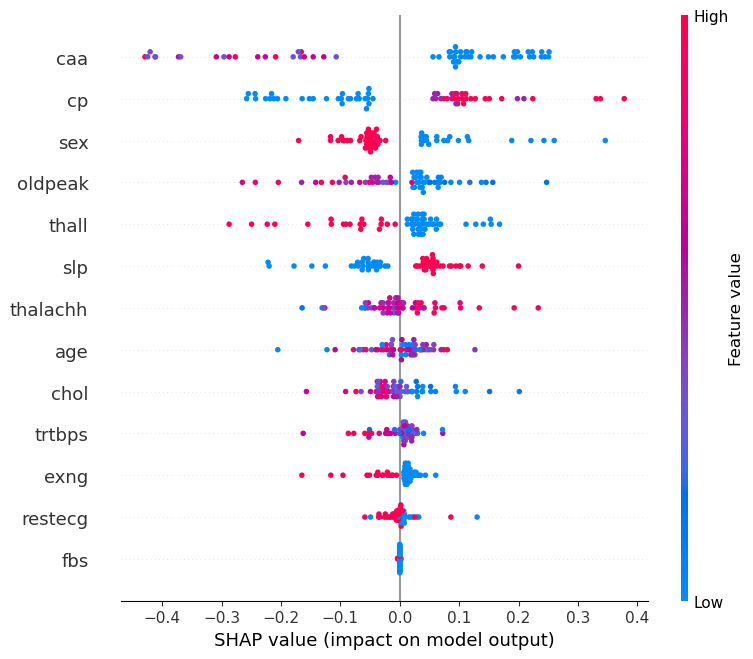

In [119]:
shap_explainer = shap.Explainer(xgb.predict, x_test)
shap_values = shap_explainer(x_test)
shap.plots.bar(shap_values)
shap.summary_plot(shap_values)